<a href="https://colab.research.google.com/github/Ruphai/UBS/blob/main/Spatial_based_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction to spatial filters**
Spatial filters are used to modify the content of an image by replacing the value of each pixel by a function of the values of the pixel and its neighbours. The neighborhood of the spatial filter operator is defined by the *mask* or *kernel* through a connectivity rule.

**Spatial filters** could be either linear or non-linear. A linear filter performs a sum of products operation between an image and a kernel. In this notebook, the implementation of both linear and non-linear spatial filters are shown. The highlights of this notebook include:

- Interactive kernel understanding: a show of the responses of both *correlation* and *convolution* operators for different kinds of kernels. 
- the influence of kernel size on the processing time of spatial operators,
- the comparison of the relative responses of different smoothing kernels, 
- the comparison of the relative responses of different sharpening kernels, 
- the comparison of the relative responses of different edge detection kernels, 
- the separability of linear kernels, 
- a demonstration of non-linear kernels, and

## Workspace utilities

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My\ Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive


##### Load required libraries 

In [ ]:
!pip install earthengine-api
! pip install geemap
! pip install geopandas

In [ ]:
import ee
import geemap
import geopandas as gp
import time

import matplotlib.pyplot as plt
from skimage.io import imread, imshow
import tifffile as tiff
import numpy as np

##### Load data from Earth Engine

In [ ]:
#@title Load Earth Engine Credentials
import ee
import os

ee_token = "1//09a_0Wm4elknZCgYIARAAGAkSNwF-L9IrLLkVV_hdFreawD5BLSR-2qkef32V8rcx8Z6cx0HB6-bUiyGqdSyAqzhyV8lV1LO7WAs"
credential = '{"refresh_token":"%s"}' % ee_token
credential_file_path = os.path.expanduser("~/.config/earthengine/")
os.makedirs(credential_file_path, exist_ok=True)
with open(credential_file_path + "credentials", "w") as file:
    file.write(credential)

ee.Initialize()
print("Welcome back %s!" % ee.data.getAssetRoots()[0]["id"].split("/")[-1])

Welcome back rufaibalogun!


In [ ]:
#@title Download satellite imagery

# Define ROI
# http://bboxfinder.com/#37.402960,-122.210112,37.448288,-122.129173
geom = ee.Geometry.Polygon(
  [[[-119.623260, 36.980615],
    [-119.623260, 37.341776],
    [-118.886490, 37.341776],
    [-118.886490, 36.980615]]], 
    None, 
    False
    )

# Download image
import requests
dataset = ee.ImageCollection("USDA/NASS/CDL")\
            .filterBounds(geom)\
            .filter(ee.Filter.date('2017-01-01', '2018-12-31'))
       
image = dataset.select('cropland') .mean()

# dataset.size().getInfo()
vizparams = trueColorVis = {'min': 0.0, 'max': 255.0, 'region': geom, 'dimensions':1024, 'format':"png"}
url = image.getThumbURL(vizparams)

with open("cropland.png", "wb") as file:
  response = requests.get(url)
  file.write(response.content)

##### Show area of interest and downloaded image

In [ ]:
# https://towardsdatascience.com/geocode-with-python-161ec1e62b89
from geopy.geocoders import Nominatim
locator = Nominatim(user_agent='myGeocoder')
#location = locator.geocode("Big Creek, California, USA")
#print("Big Creek Location: ", "Latitude = {}, Longitude = {}".format(location.latitude, location.longitude))

In [ ]:
#@ Display study area
import folium
# https://medium.com/image-vision/folium-all-you-need-for-map-visualization-206e88c8ac
from branca.element import Figure
fig=Figure(width=550,height=350)

map=folium.Map(width=550,height=350,location=[37.2049456, -119.2459561],zoom_start=14,min_zoom=6,max_zoom=14)
fig.add_child(map)
map

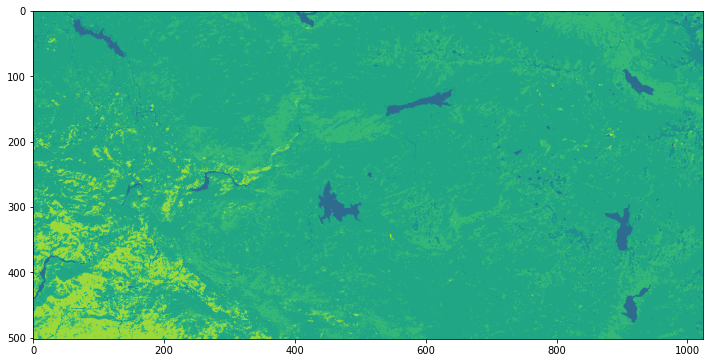

In [ ]:
# display image
from PIL import Image
import matplotlib.pyplot as plt
image = Image.open('cropland.png')
image = np.asarray(image)
plt.figure(figsize=(12, 8))
plt.imshow(image)

##**Interactive kernel understanding.** 
In this section, the different behaviours of the spatial correlation and spatial convolution operators were evaluated using different kernel coefficients. This section is split into two major parts:
1. The correlation and convolution operators were implemented and cases were made for dealing with the edge pixels.
2. The correlation and convolution operators were tested with the different coefficients of the Kernels. The following basic kernels were tested: 
- $ΣW$ =0
- $ΣW$ = Id
- $ΣW$ = 1
- |$ΣW$| > 1, < 1, = 1, = 0, with some $w_i$  negative

##### **Digital image convolution and correlation operators**
Define the spatial correlation and spatial convolution operators.

In [ ]:
def convolution(img, kernel):
  """
  Spatial convolution operators
  Args: img (array), kernel(array)
  """
  # extract the height and width of image
  N= img.shape[0]
  M = img.shape[1]
  # extract the height and width of kernel
  I = kernel.shape[0] 
  J = kernel.shape[1]

  trans_img = np.zeros((N-1, M-1))

  # convolve the image
  for i in range(N - I + 1):
    for j in range(M - J + 1):
      trans_img[i, j] = np.sum(img[i:i+I, j:j+J] * kernel)
  
  trans_img = np.asarray(trans_img)
  return trans_img

In [ ]:
# create a plotting function for both original and spatially filtered image
def plot_filters(img, filters):
  fig, axs = plt.subplots(1, 2, figsize=(16, 5))
  axs[0].imshow(img, cmap="gray")
  axs[0].set_title("Original image")

  axs[1].imshow(filters, cmap="gray")
  axs[1].set_title("Spatially filtered image")

In [ ]:
def corr(img, kernel):
  N, M = img.shape[0], img.shape[1]
  kernel = kernel[::-1, ::-1]
  I, J = kernel.shape[0], kernel.shape[1]

  trans_img = np.zeros((N-1, M-1))

  for i in range(N - I + 1):
    for j in range(M - J + 1):
      trans_img[i, j] = np.sum(img[i:i+I, j:j+J] * kernel)
  
  trans_img = np.asarray(trans_img)
  
  return trans_img

##### **Test the Correlation and convolution operators using different Kernel definitions**

###### Filter one

Kernel: 
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


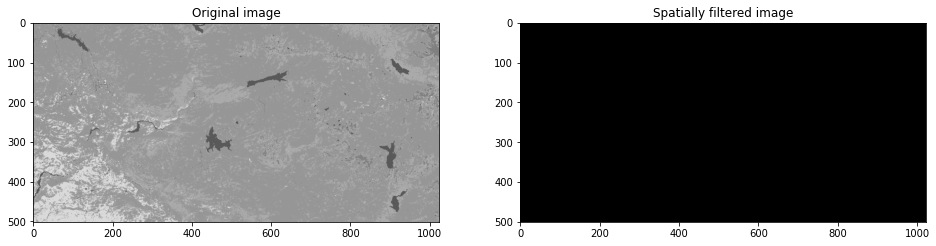

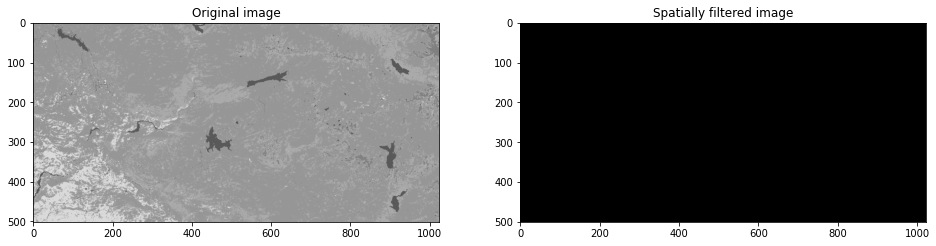

In [ ]:
# Convolution
A1 = np.zeros((3, 3))
print("Kernel: \n", A1)
plot_filters(image, convolution(image, A1))
# Correlation::
plot_filters(image, corr(image, A1))

###### Filter two

Kernel: 
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


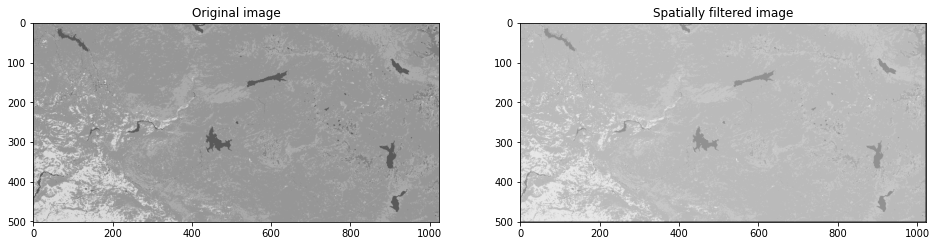

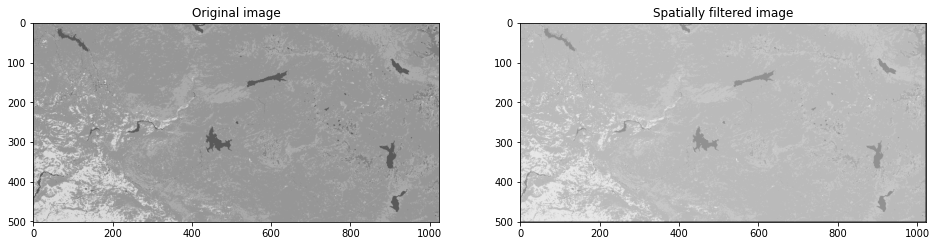

In [ ]:
# Convolution
A2 = np.array([
               [0, 0, 0], 
               [0, 1, 0], 
               [0, 0, 0]
              ])
print("Kernel: \n", A1)
plot_filters(image, convolution(image, A2))
# correlation
plot_filters(image, corr(image, A2))

###### Filter three

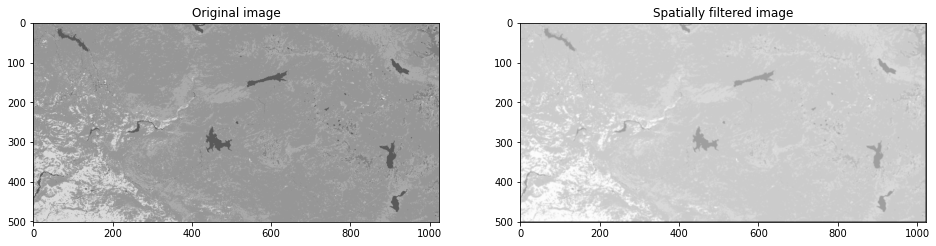

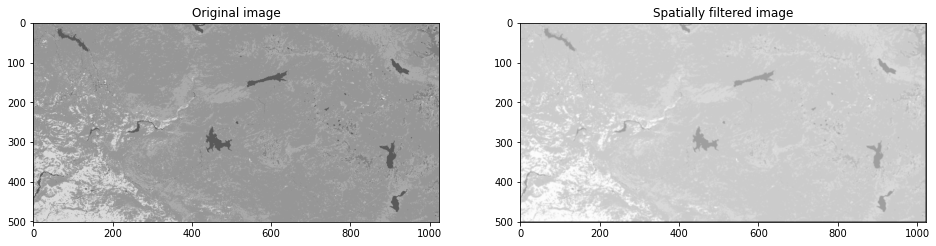

In [ ]:
# Convolution
A3 = np.ones((3, 3)) # identity kernel
plot_filters(image, convolution(image, A3))
# correlation
plot_filters(image, corr(image, A3))

###### Filter four

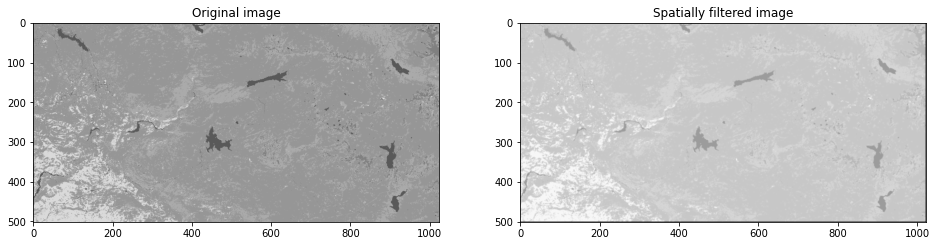

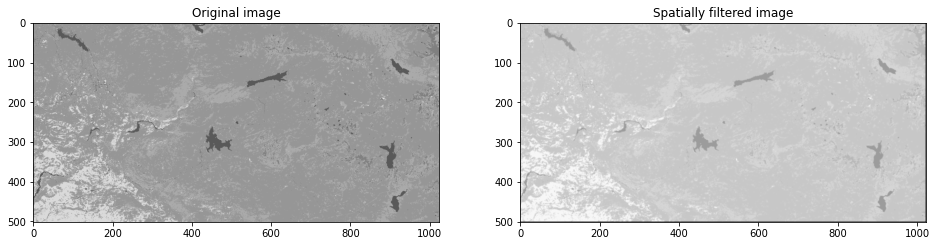

In [ ]:
# Convolution
A4 = np.array([
               [1, 2, 1], 
               [2, 4, 2], 
               [1, 2, 1]
              ])

plot_filters(image, convolution(image, A4))
# correlation
plot_filters(image, corr(image, A4))

###### Filter five

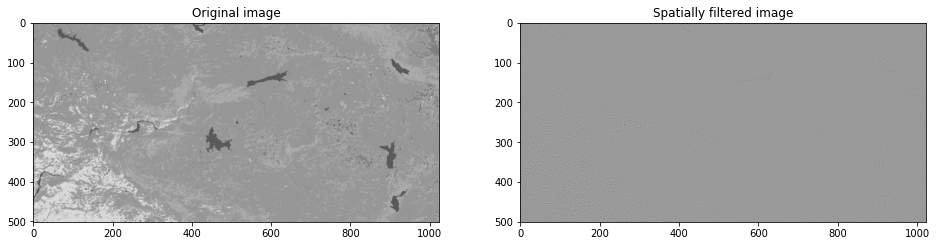

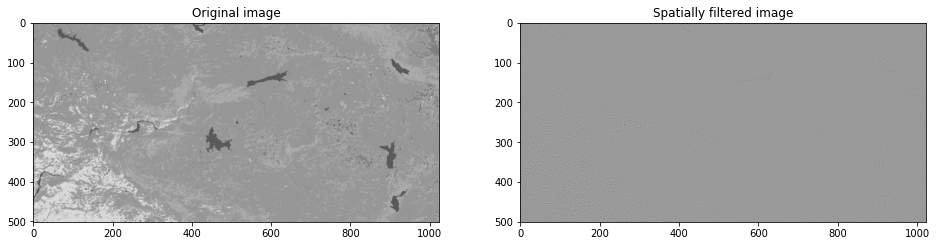

In [ ]:
# Convolution
A5 = np.array([
               [-1, -1, -1], 
               [-1, 8, -1], 
               [-1, -1, -1]
              ]) # laplacian kernel

plot_filters(image, convolution(image, A5))
# correlation
plot_filters(image, corr(image, A5))

###### Filter six

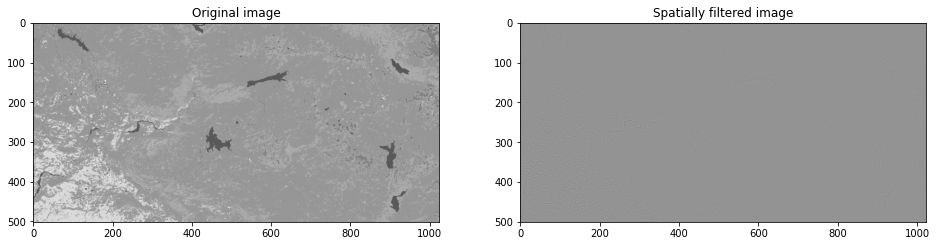

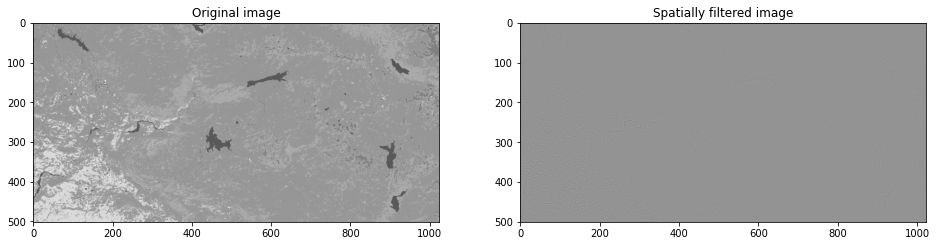

In [ ]:
# Convolution
A6 = np.array([
               [0, -1, 0], 
               [-1, 4, -1], 
               [0, -1, 0]
              ]) ## laplacian kernel

plot_filters(image, convolution(image, A6))
plot_filters(image, corr(image, A6))

###### Filter seven

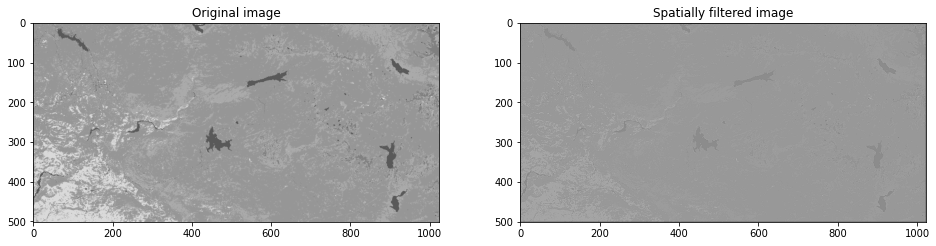

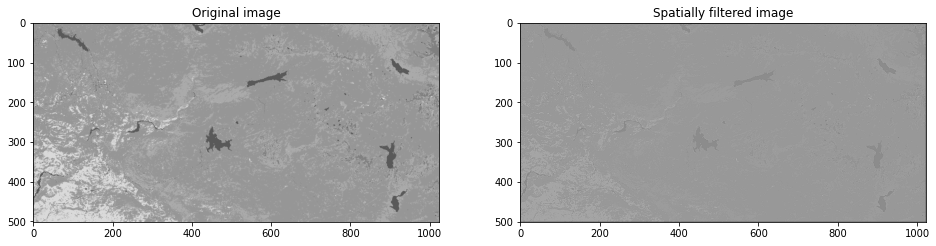

In [ ]:
# Convolution
A7 = np.array([
               [0, -1, 0], 
               [-1, 5, -1], 
               [0, -1, 0]
              ])

plot_filters(image, convolution(image, A7))
# correlation
plot_filters(image, corr(image, A7))

###### Filter eight

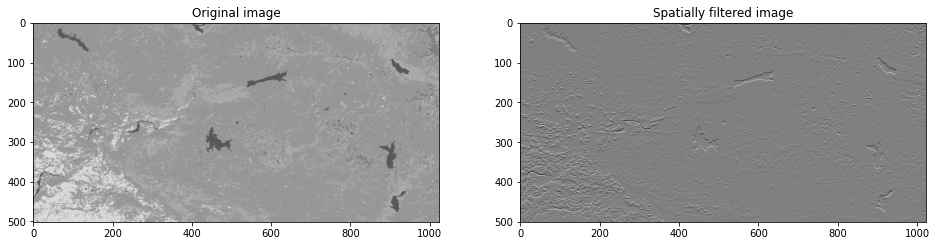

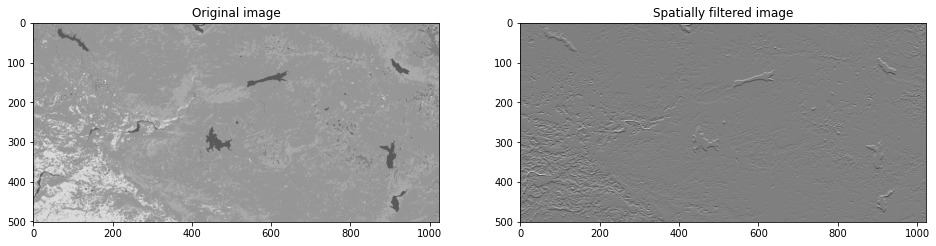

In [ ]:
# Convolution
A8 = np.array([
               [-1, -1, -1], 
               [0, 0, 0], 
               [1, 1, 1]
              ]) # horizontal line extraction kernel

plot_filters(image, convolution(image, A8))
#correlation
plot_filters(image, corr(image, A8))

###### Filter nine

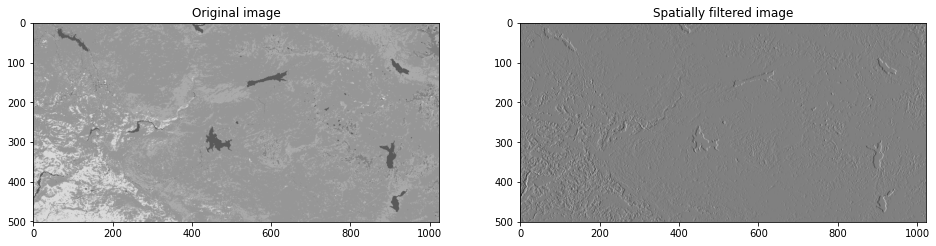

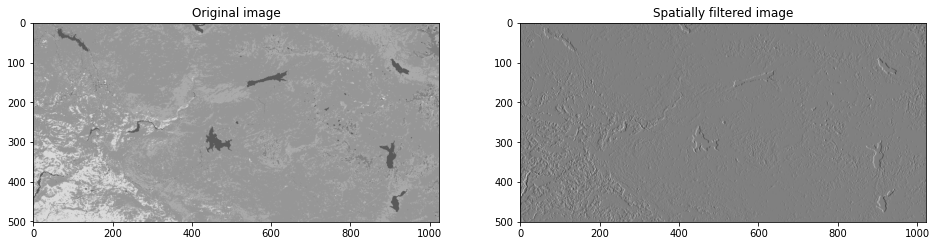

In [ ]:
# Convolution
A9 = np.array([
               [-1, 0, 1], 
               [-1, 0, 1], 
               [-1, 0, 1]
              ]) #vertical line extraction kernel

plot_filters(image, convolution(image, A9))
# correlation
plot_filters(image, corr(image, A9))

##### **Compare with other Convolution functions in Python Libraries**

Here, we take a look the responses obtained from the local implementation of the convolution and correlation operator and an established convolution and correlation operaor in a popular python library.

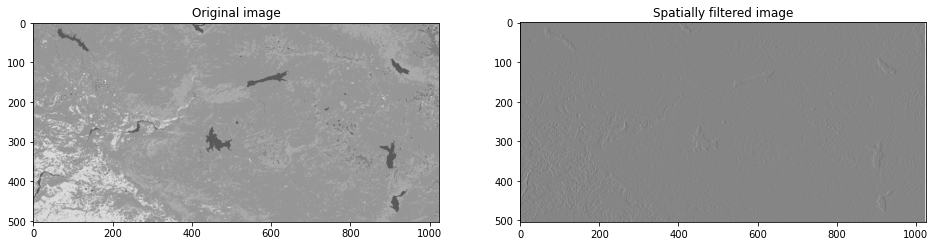

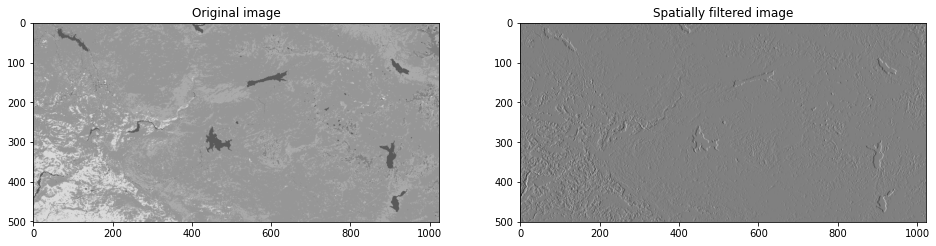

In [ ]:
from scipy.signal import convolve2d, correlate2d
plot_filters(image, convolve2d(image, A9))
plot_filters(image, convolution(image, A9))

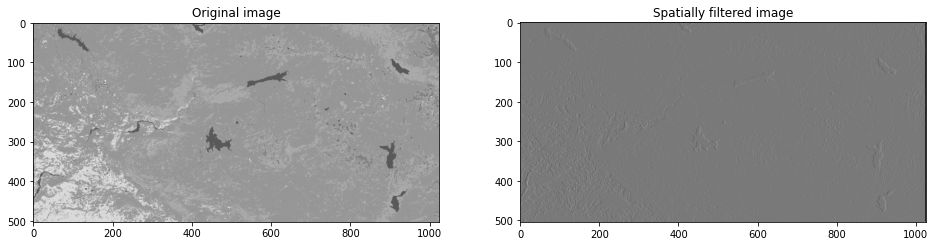

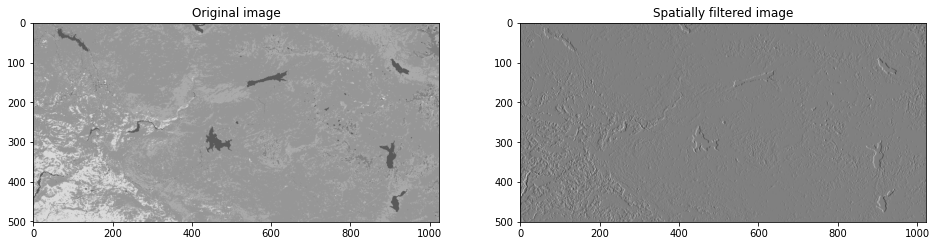

In [ ]:
plot_filters(image, correlate2d(image, A9))
plot_filters(image, corr(image, A9))

##### **The question we've been avoiding has been, how do we deal with the dark edge pixels that results from our transformation so far?**

In many image processing and analysis workflow, the issue of edge pixel missing out information or misrepresenting the reality has been a perpetual challenge. To deal with this challenge, we propose at least three methods:  
- Padding the edge pixels with zeros, 
- repeating some part of the pixels to give the image enough neighbors, or
- just ignore them, like we've been doing so far. 

Zero padding is mostlu used to deal with the edge pixels and it is highly recommended as an approach for totally losing the edge information

## **Smoothing, Sharpening, Edge Detection and Non-linear filters.**
In this section of the notebook, we perfromed series of spatial-based analysis using predefined convolutions or direct loop implementations in Python. The main steps we implement in the lab include:
- For a given *spatial operator*, compare the filtering effect and CPU time when increasing the kernel size, 
- For a given spatial operator, compare the filtering effect and CPU time for a 2D separable kernel and its 1D alternatives. 
- Compare the results of the different smoothing operators availble, 
- Compare the results of the different sharpening operators, 
- Compare the results of the different edge detection operators, 
- Check if the different smoothing/ sharpening operators are invertible. 
- Compare the linear and the non-linear filtering operators, 
- Propose separable implementations of non-linear operators,
- Verify the ability of edge-preserving smoothing filters.

#### **Influence of kernel size on the processing time of spatial operators**

Here, we considered a specific case of a *spatial operator*, and increased the dimensions of the kernels at different runs and recorded the runtime performance as well as the visible filtering effect the kernel size had on the image at hand.

###### Construct a sample 2D image

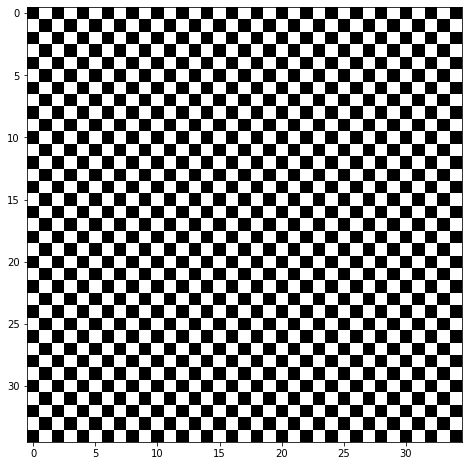

In [ ]:
from skimage import filters

# create an image
import numpy as np
checker_img = np.zeros((35, 35))
checker_img[::2, 1::2] = 1
checker_img[1::2, ::2] = 1

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
plt.imshow(checker_img, cmap='gray', interpolation='nearest')

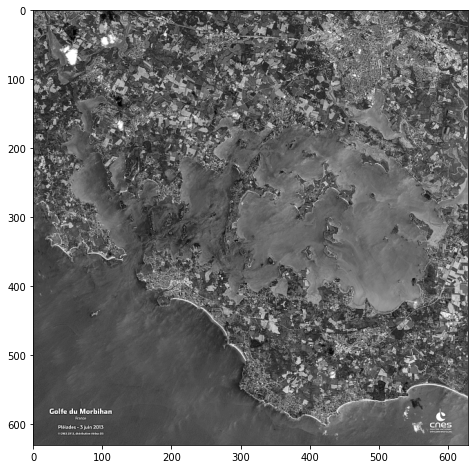

In [ ]:
# import an RGB image
from skimage.color import rgb2gray
sample = plt.imread("/content/drive/MyDrive/UBS/Computer Vision/Data/P59704_Vignette.jpg")
# convert to grayscale image
sample = rgb2gray(sample)
plt.figure(figsize=(12, 8))
plt.imshow(sample, cmap="gray")

###### Define and iteratively increase the size of the kernel

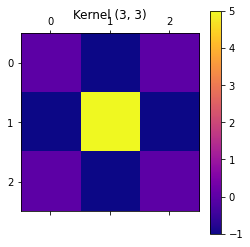

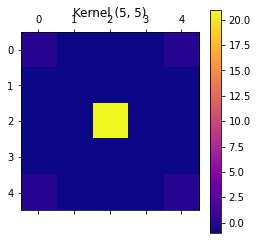

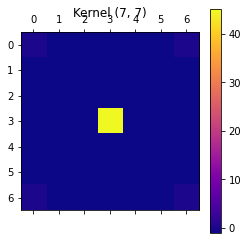

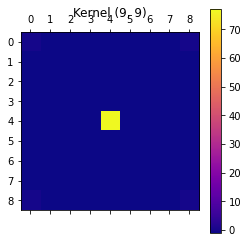

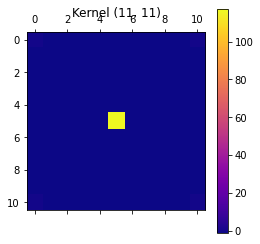

In [ ]:
# Test kernels of different sizes::: 3 by 3, 5 by 5, 7 by 7, and 11 by 11. 
# construct a 3 by 3 sharpening kernel based on the Laplacian Kernel
K1 = np.zeros((3, 3))
K1[0, 1] = -1
K1[1, 0] = -1
K1[1, 1] = 5
K1[2, 1] = -1
K1[1, 2] = -1

# extend it to 5 by 5
K2 = np.pad(K1, (1, 1), 'constant')
K2[0::] = -1
K2[0,0] = 0
K2[-1,-1] = 0
K2[0,-1] = 0
K2[-1, 0] = 0
K2[2, 2] = 21

# extend it to 7 by 7
K3 = np.pad(K2, (1, 1), 'constant')
K3[0::] = -1
K3[0,0] = 0
K3[-1,-1] = 0
K3[0,-1] = 0
K3[-1, 0] = 0
K3[3, 3] = 45

# extend it to 9 by 9
K4 = np.pad(K3, (1, 1), 'constant')
K4[0::] = -1
K4[0,0] = 0
K4[-1,-1] = 0
K4[0,-1] = 0
K4[-1, 0] = 0
K4[4, 4] = 77

# extend it to 11 by 11
K5 = np.pad(K4, (1, 1), 'constant')
K5[0::] = -1
K5[0,0] = 0
K5[-1,-1] = 0
K5[0,-1] = 0
K5[-1, 0] = 0
K5[5, 5] = 117


kernels = [K1, K2, K3, K4, K5]
for k in kernels:
  plt.matshow(k, cmap='plasma')
  plt.title(f"Kernel {k.shape}")
  plt.colorbar()

###### Test the processing time and filtering effect of the different kernels on the image

0.00018106000061379746
0.0001560259997859248
0.0002751039992290316
0.0004423459995450685
0.00064595699950587


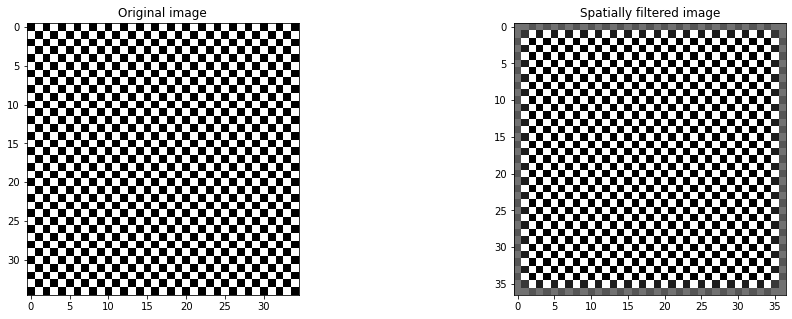

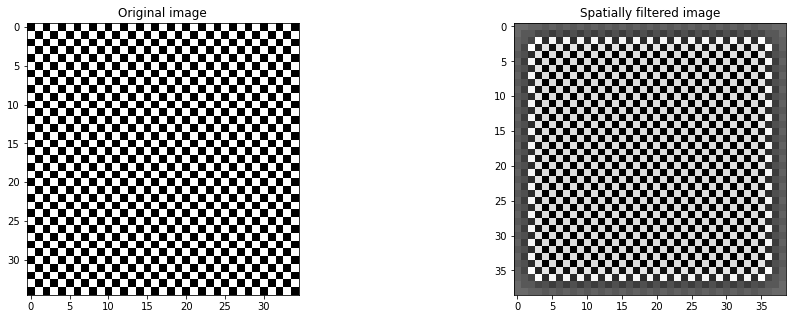

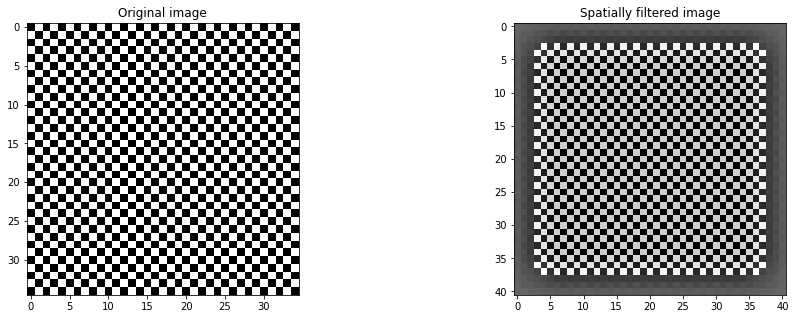

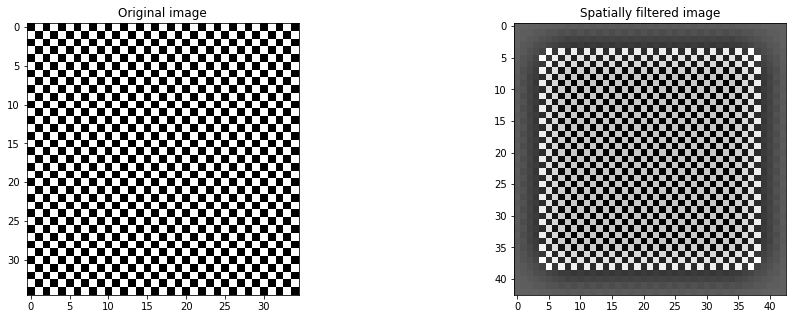

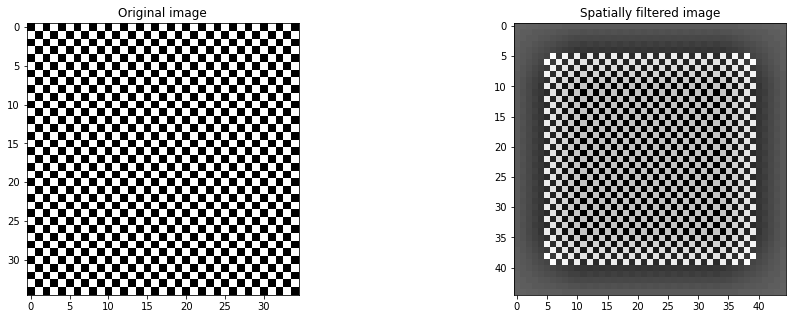

In [ ]:
# convolution and check processing time
from scipy.signal import convolve2d
from time import perf_counter

def conv_2d(img, kernel):
  start = perf_counter()
  conv_img = convolve2d(img, kernel)
  end = perf_counter()
  elapse_time = end - start
  print(elapse_time)
  return conv_img

for k in kernels:
  plot_filters(checker_img, conv_2d(checker_img, k))

0.022263590999500593
0.03423456400014402
0.06663503700019646
0.09805798600064008
0.13795337899955484


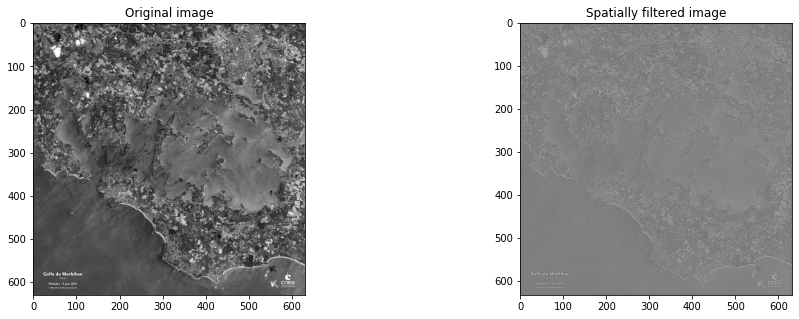

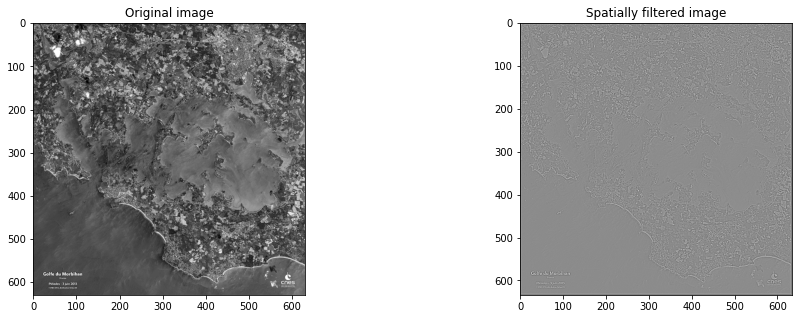

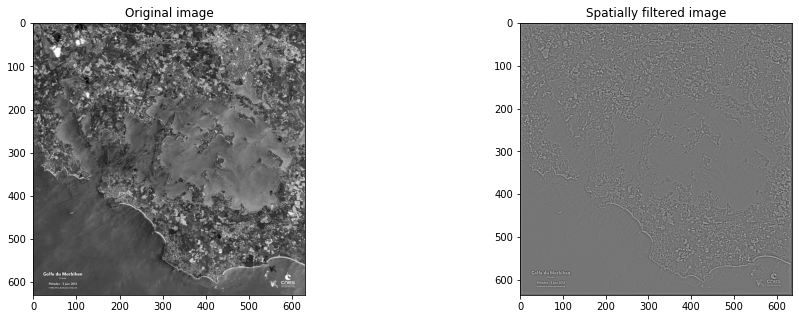

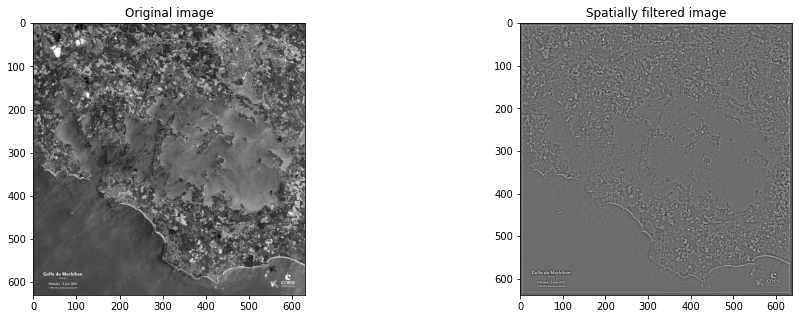

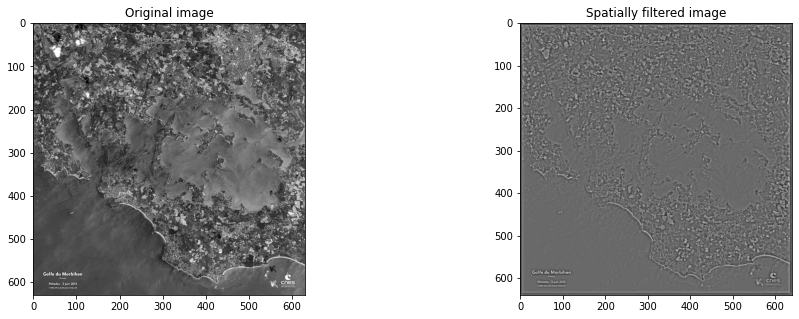

In [ ]:
for k in kernels:
  plot_filters(sample, conv_2d(sample, k))

The two examples shown above tells us that the larger the kernel, the more edge information we would lose and the more time it takes to process. We should becareful to note that the nature of the Kernel also impacted the degree of edge pixels that were lost. 
An alternative approach to using large-sized kernels is to use series of separable kernels. Separable kernels are presented in the next section of this notebook. 

#### **The separability of linear kernels** 
In theory, a 2D linear kernel is considered to be separable if it can be expressed as the outer product of two vectors. This approach is proposed as a faster approach for filtering compared to using a large-sized kernel. For instance, given an image with M-by-N dimension and a kernel with dimension P-by-Q to be filtered, we would need about MNPQ multiples and additions. If the kernel is separable, we will only need to do this filtering in two step and lesser computation time: 
- First, we need MNP multiples and addition, 
- Second, we need MNQ multiples and addition, 
These two steps would results to a total of MN(P + Q), leading a better computational advantage.

In this session, we show the separability of some kernels and implemented them for filtering our images. See the examples shown below.

###### How do we know a convolutional image kernel is separable?
Going by the definition already given, we only need to check if it can be expressed as the outer products of two vectors. As already known, the kernels in image processing are defined as matrices, and hence would require an algebraic approach for discovering the nature of the kernel. A well-known approach is to find the rank of the kernel/ matrix with the use of the **Singular Value Decomposition** method in linear algebra. If our matrix is separable, then it is rank 1, and will have only single singular value.

In this session of the notebook, we consider three cases of Kernels we know are linearly separable and we double check their rank to confirm, reconstructed the original matrix from the SVD components and compared with the outer products of the matrices 1D derivatives. We considered the following filters: 
- Box filter, 
- Prewitt filter, and 
- Sobel filter. 

And then, we compared the performance of this 1D kernels with their 2D kernels.


###### Let's start with a simple box filter we know is linearly separable. 

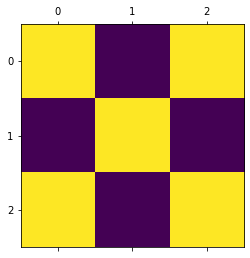

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage
# 2D seperable kernel and its 1D derivatives
Av = np.array([-1, 1, -1])
Ah = np.array([-1, 1, -1])
box = np.outer(Av.T, Ah)
plt.matshow(box)

In [ ]:
#check if it is linearly separable
U, E, V = np.linalg.svd(box)

print("Single Value Component", E, "\n")

print("Reconstruct the Box Kernel")
print(U.dot((np.diag(E)).dot(V)), "\n")
np.outer(Av.T, Ah)

Single Value Component [3.00000000e+00 2.55806258e-17 2.11125548e-48] 

Reconstruct the Box Kernel
[[ 1. -1.  1.]
 [-1.  1. -1.]
 [ 1. -1.  1.]] 



array([[ 1, -1,  1],
       [-1,  1, -1],
       [ 1, -1,  1]])

We can see that it has only one significant singular value showing that it has a rank of 1.

0.027847929000017757
0.021445929000037722
0.02086223000060272


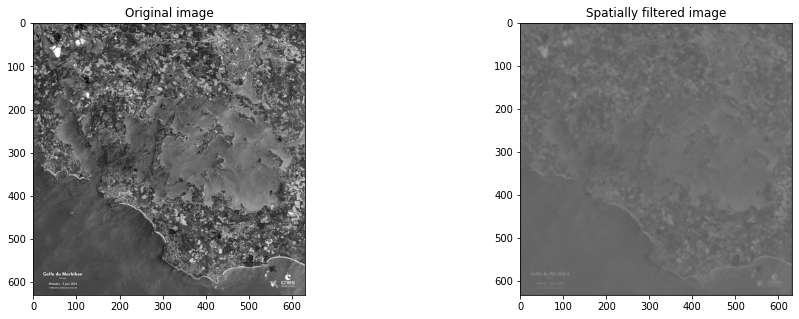

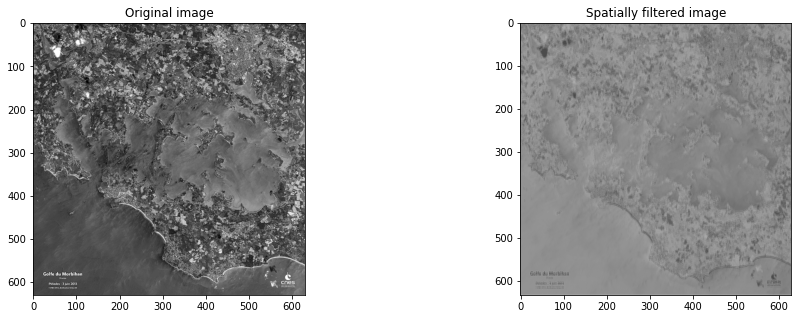

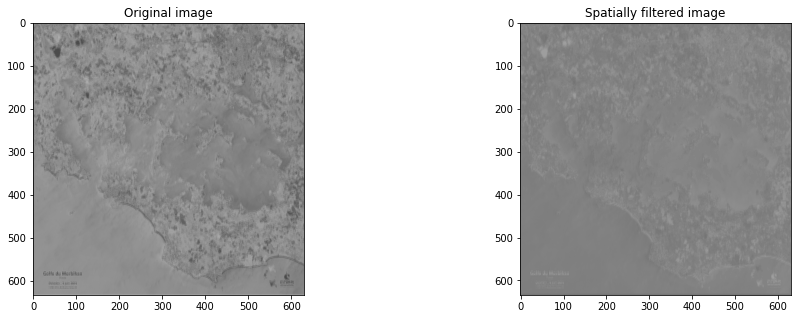

In [ ]:
Ah = Ah.reshape(3, 1)
Av= Av.reshape(3, 1)
box_img = conv_2d(sample, box) # direct with the box kernel
img1 = conv_2d(sample, Ah) # consequent use of the 1D derivative
img2 = conv_2d(img1, Av) # consequent use of the 1D derivative


plot_filters(sample, box_img)
plot_filters(sample, img1)
plot_filters(img1, img2)

###### What about the Prewitt Filters?

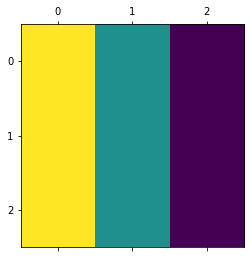

In [ ]:
# the prewitt kernel
prewitt = np.array([
              [1, 0, -1],
              [1, 0, -1],
              [1, 0, -1]])

plt.matshow(prewitt)

In [ ]:
# check it's rank using SVD
# since we know that the Prewitt kernel is separable, we will test the output of
# the SVD with the outer product of the two vectors. 

v = np.array([1, 1, 1])
h = np.array([1, 0, -1])

U, E, V = np.linalg.svd(prewitt)
print("Single Value Component", E, "\n")

print("Reconstruct the Prewitt Kernel")
print(U.dot((np.diag(E)).dot(V)), "\n")
np.outer(v.T, h)


Single Value Component [2.44948974e+00 2.21534718e-17 0.00000000e+00] 

Reconstruct the Prewitt Kernel
[[ 1.  0. -1.]
 [ 1.  0. -1.]
 [ 1.  0. -1.]] 



array([[ 1,  0, -1],
       [ 1,  0, -1],
       [ 1,  0, -1]])

0.016602667999904952
0.015117515999918396
0.01305925999986357


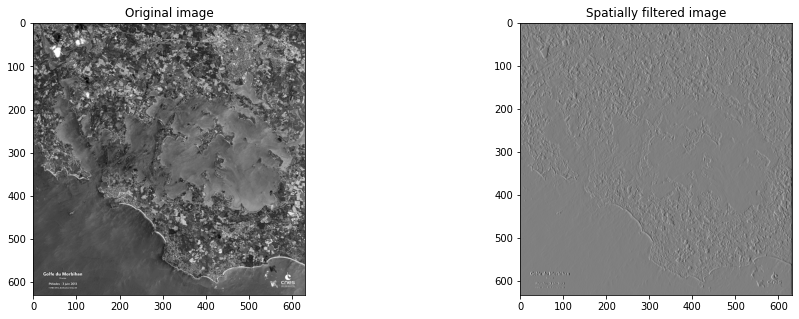

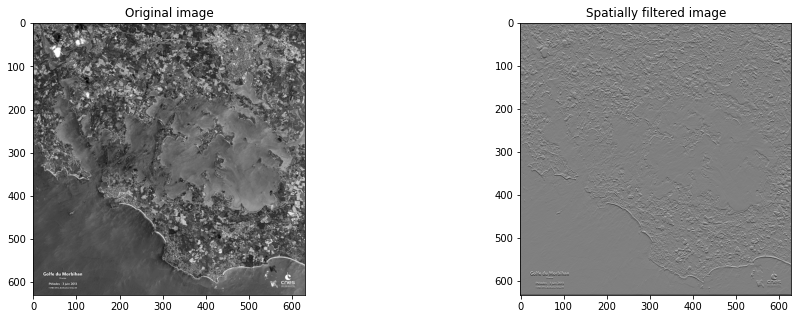

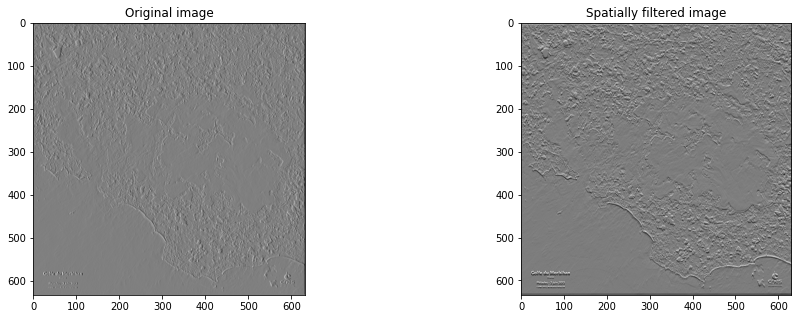

In [ ]:
h = h.reshape(3, 1)
v= v.reshape(3, 1)
prewitt_img = conv_2d(sample, prewitt) # direct with the box kernel
img1 = conv_2d(sample, h) # consequent use of the 1D derivative
img2 = conv_2d(img1, v) # consequent use of the 1D derivative

plot_filters(sample, prewitt_img)
plot_filters(sample, img1)
plot_filters(prewitt_img, img2)

###### What about sobel?

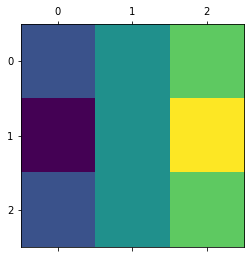

In [ ]:
# what about Sobel
sobel = np.array([
              [-1, 0, 1],
              [-2, 0, 2],
              [-1, 0, 1]])
plt.matshow(sobel)


In [ ]:
v = np.array([1, 2, 1])
h = np.array([-1, 0, 1])

U, E, V = np.linalg.svd(sobel)
print("Single Value Component", E, "\n")

print("Reconstruct the Sobel Kernel")
print(U.dot((np.diag(E)).dot(V)), "\n")
np.outer(v.T, h)


Single Value Component [3.46410162e+00 4.34470263e-16 0.00000000e+00] 

Reconstruct the Sobel Kernel
[[-1.  0.  1.]
 [-2.  0.  2.]
 [-1.  0.  1.]] 



array([[-1,  0,  1],
       [-2,  0,  2],
       [-1,  0,  1]])

0.017884196000522934
0.01680851099990832
0.012363225999251881


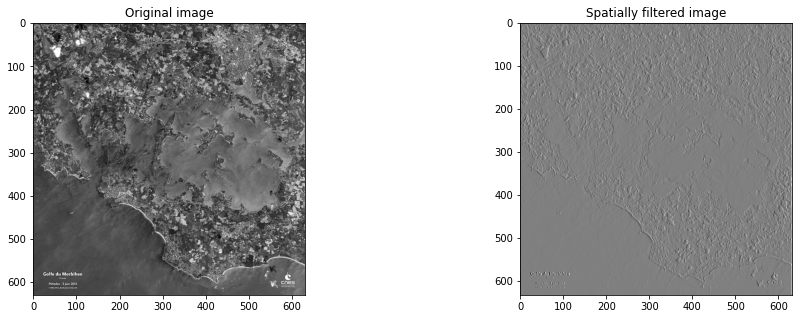

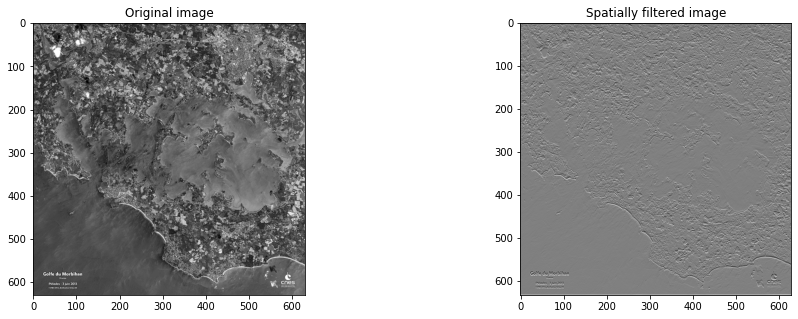

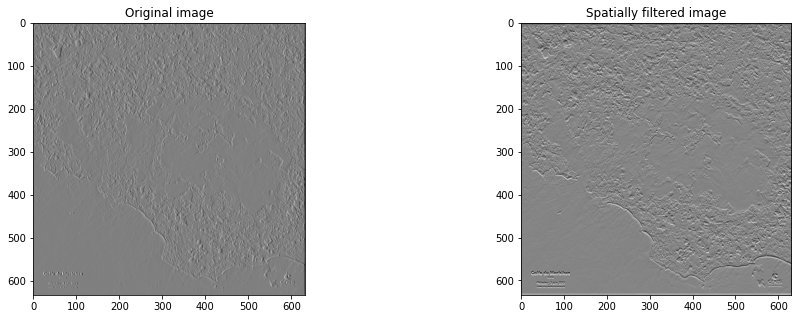

In [ ]:
h = h.reshape(3, 1)
v= v.reshape(3, 1)
sobel_img = conv_2d(sample, sobel) # direct with the box kernel
img1 = conv_2d(sample, h) # consequent use of the 1D derivative
img2 = conv_2d(img1, v) # consequent use of the 1D derivative

plot_filters(sample, sobel_img)
plot_filters(sample, img1)
plot_filters(prewitt_img, img2)

#### **Image Smoothing**
Typically, images usually some unnecessary signals known as noise that we would need to filter out. At other time, we might just need to blur it out to reduce the sharpness and easily extract certain features in the image. In this case, we convolve the image with a low-pass filter kernel. Image smoothing with low pass kernels are useful for removing high frequency contents such as noise and edges from an images. Since edges are also important features in image processing, specialized kernels have been developed to preserved the edges in the image (we will consider these kinds of kernels in another section of this notebook). In this section, we will consider primarily three smoothing kernels: 
- Mean filters (Moving average filters),
- Gaussian filters, and 
- Median filters

##### Mean filters (Moving average) filter

In [ ]:
mean_kernel = np.ones((5,5),np.float32)/(5**2)
mean_kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

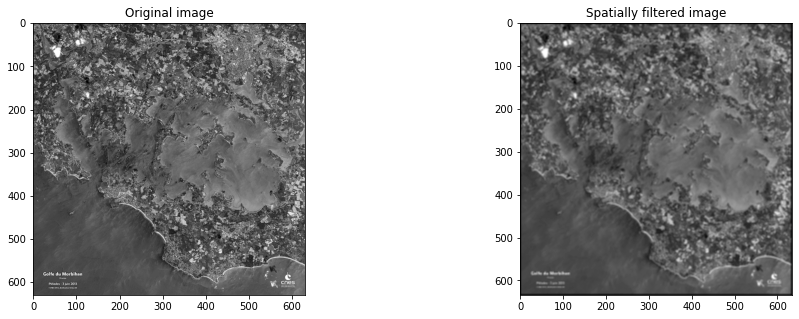

In [ ]:
plot_filters(sample, convolve2d(sample, mean_kernel))

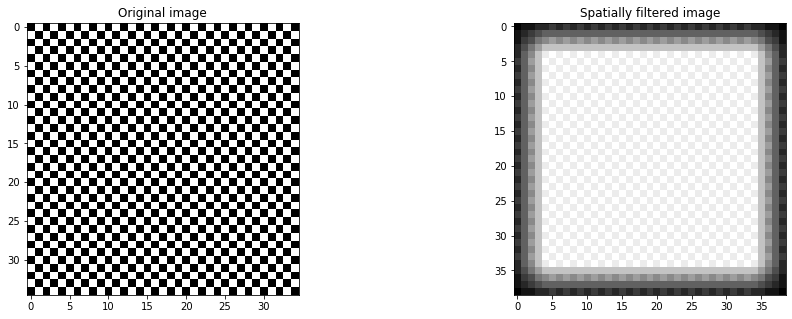

In [ ]:
plot_filters(checker_img, convolve2d(checker_img, mean_kernel))

##### Gaussian smoothing

In [ ]:
# Gaussian smoothing
# define a 9 by 9 gaussian kernel
def gaussian_kernel(size, sigma=1):
  size = int(size) // 2
  x, y = np.mgrid[-size:size+1, -size:size+1]
  normal = 1 / (2.0 * np.pi * sigma**2)
  g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
  return g

size=5
gauss = gaussian_kernel(9)

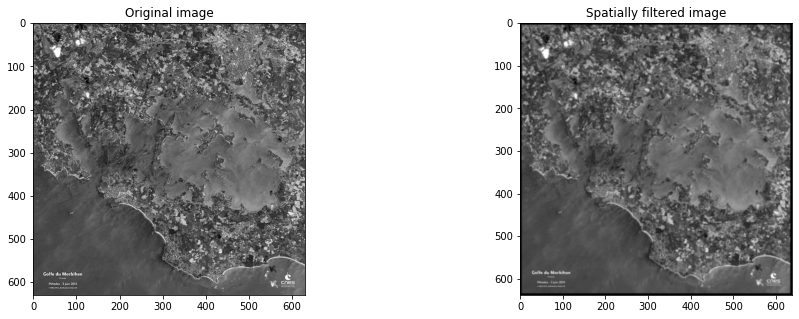

In [ ]:
plot_filters(sample, convolve2d(sample, gauss))

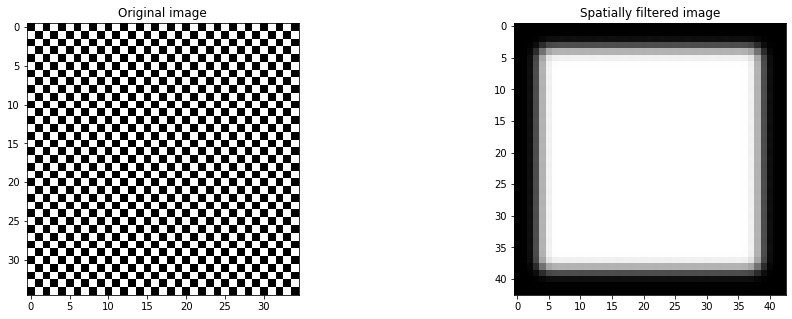

In [ ]:
plot_filters(checker_img, convolve2d(checker_img, gauss))

##### Median Filtering
Median filtering computes the median of all the pixels under the kernel window and replaces the central pixel with this median value. While other filters might be often useful, this method is highly effective in removing salt-and-pepper noise.

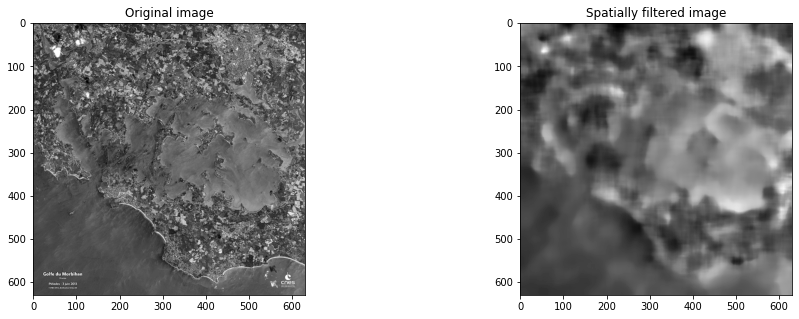

In [ ]:
from scipy import ndimage, misc
from scipy.ndimage import median_filter
plot_filters(sample, median_filter(sample, size = 30))

#### **Sharpening kernels**
Sharpening kernels are used to find are area with differences in neighborhood and enhancing these differences even more. This is computed through the computation of image gradients. Here, we take a look at two fundamental sharpening kernels:
- the Laplacian Kernels, and 
- the High-boost filtering kernels

###### The Laplacian Kernels

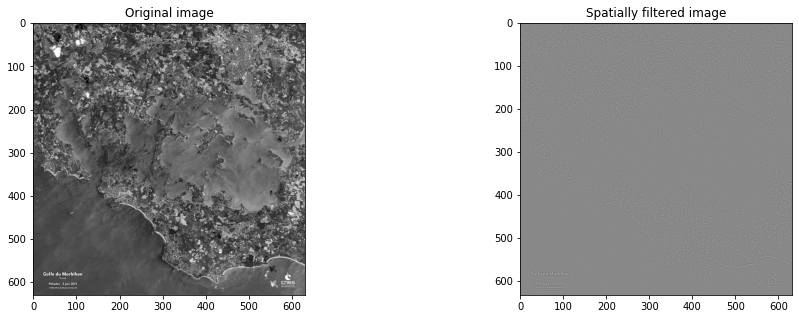

In [ ]:
lap1 = np.array([[0, -1, 0],
                 [-1, 4, -1],
                 [0, -1, 0]])

lap2 = np.array([[-1, -1, -1],
                 [-1, 8, -1],
                 [-1, -1, -1]])

plot_filters(sample, convolve2d(sample, lap1))

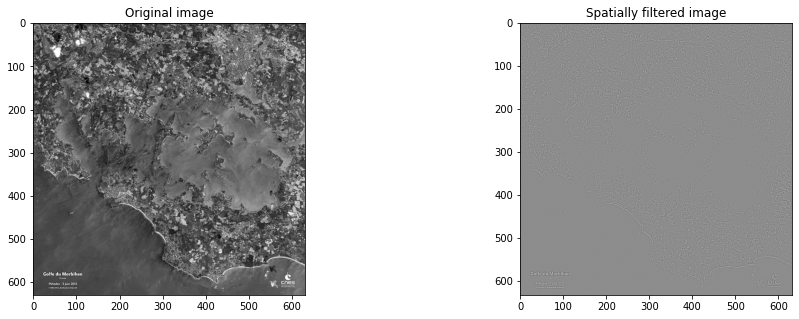

In [ ]:
plot_filters(sample, convolve2d(sample, lap2))

###### The High-boost kernels

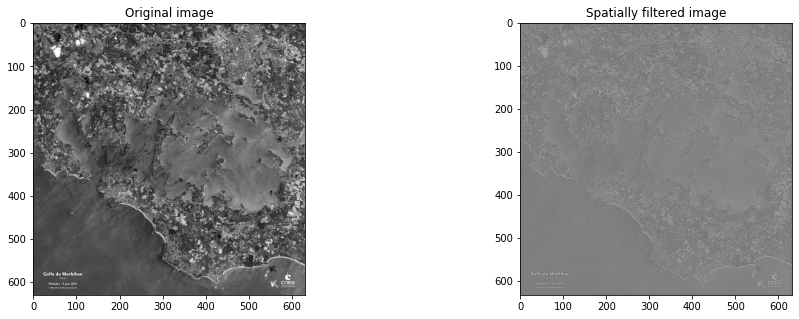

In [ ]:
# compare the results of different sharpening operators
high_b1 = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

high_b2 = np.array([[-1, -1, -1],
                    [-1, 9, -1], 
                    [-1, -1, -1]])

plot_filters(sample, convolve2d(sample, high_b1))

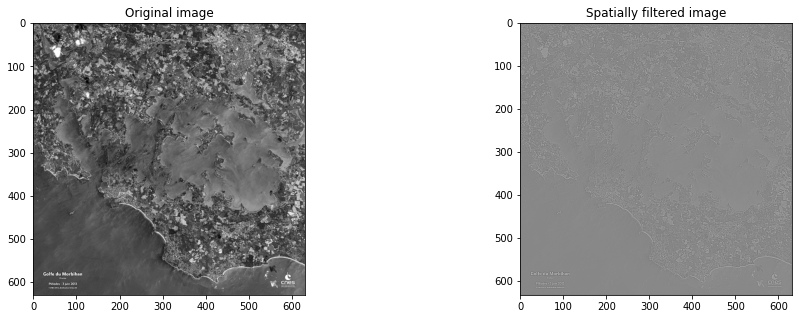

In [ ]:
plot_filters(sample, convolve2d(sample, high_b2))

#### **Edge Detection Kernels**
Edges represents areas in an image with high gradients. They usually represent object boundaries. 

- Sobel Filter, 
- Canny Filter, 
- Roberts Filter, 
- Prewitts,
- Kirsch Compass Edge Detector


Text(0.5, 1.0, 'Prewitt Filter')

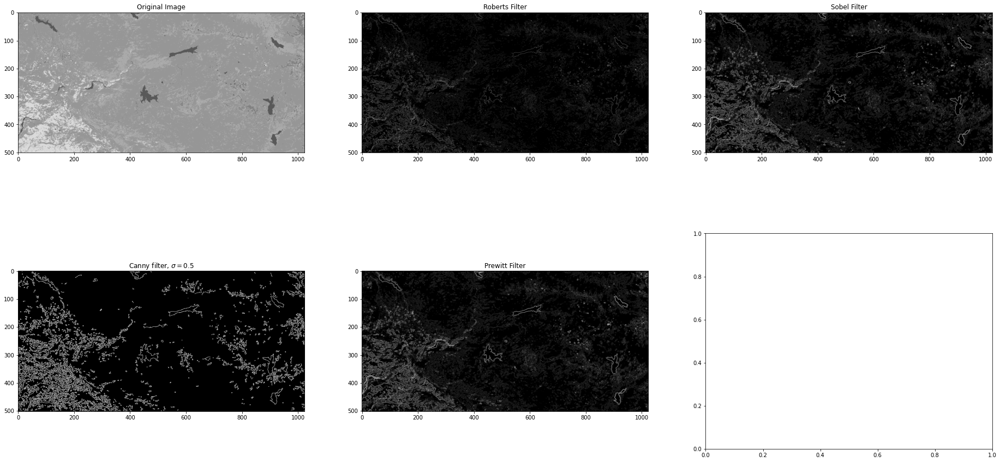

In [ ]:
# compare the results of different edge detection operators
from skimage import feature
from skimage import filters

#prewitts 
edge_roberts = filters.roberts(image)
edge_sobel = filters.sobel(image)
edges_canny = feature.canny(image, sigma=0.5)
edges_prewitt = filters.prewitt(image)

fig, axs = plt.subplots(2, 3, figsize=(32, 16))

axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title("Original Image")

axs[0, 1].imshow(edge_roberts, cmap='gray')
axs[0, 1].set_title("Roberts Filter")

axs[0, 2].imshow(edge_sobel, cmap='gray')
axs[0, 2].set_title("Sobel Filter")

axs[1, 0].imshow(edges_canny, cmap='gray')
axs[1, 0].set_title(r'Canny filter, $\sigma=0.5$')

axs[1, 1].imshow(edges_prewitt, cmap='gray')
axs[1, 1].set_title("Prewitt Filter")

In [ ]:
# Kirsch Compass Kernel

N = np.array([
              [-3, -3, 5], 
              [-3, 0, 5],
              [-3, -3, 5]
              ])

NW = np.array([
              [-3, 5, 5], 
              [-3, 0, 5],
              [-3, -3, -3]
              ])
W = np.array([
              [5, 5, 5], 
              [-3, 0, -3],
              [-3, -3, -3]
              ])

SW = np.array([
              [5, 5, -3], 
              [5, 0, -3],
              [-3, -3, -3]
              ])

S = np.array([
              [5, -3, -3], 
              [5, 0, -3],
              [5, -3, -3]
              ])

SE = np.array([
              [-3, -3, -3], 
              [5, 0, -3],
              [5, 5, -3]
              ])

E = np.array([
              [-3, -3, -3], 
              [-3, 0, -3],
              [5, 5, 5]
              ])

NE = np.array([
              [-3, -3, -3], 
              [-3, 0, 5],
              [-3, 5, 5]
              ])

Text(0.5, 1.0, 'North East Direction Image')

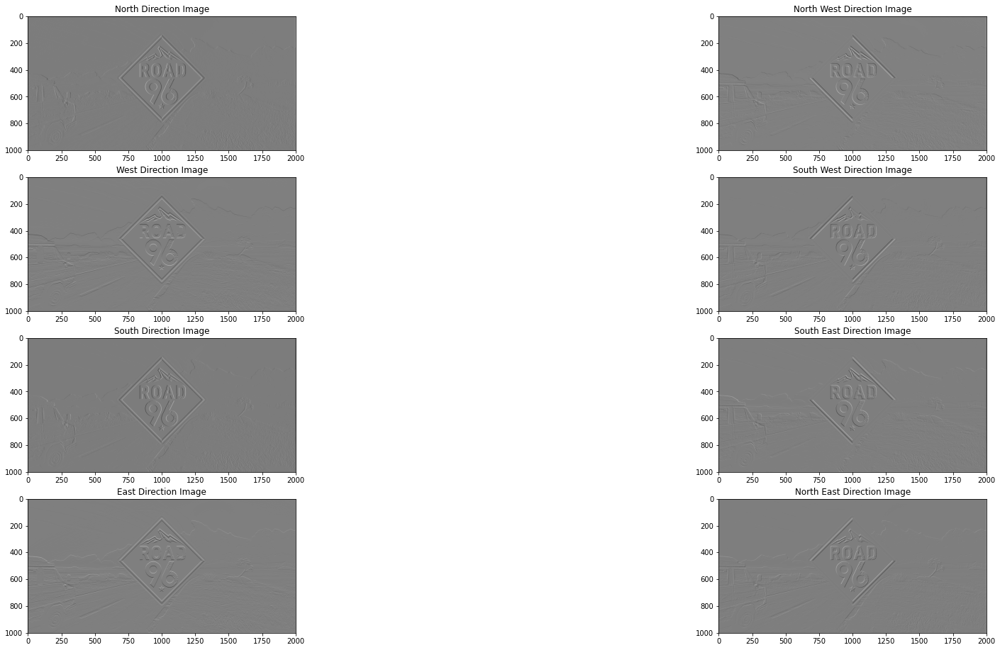

In [ ]:
kirsch_img = plt.imread("/content/drive/MyDrive/UBS/Computer Vision/Data/sample.jpg")
kirsch_img = rgb2gray(kirsch_img)

fig, axs = plt.subplots(4,2, figsize=(32, 16))

axs[0, 0].imshow(convolve2d(kirsch_img, N), cmap='gray')
axs[0, 0].set_title("North Direction Image")

axs[0, 1].imshow(convolve2d(kirsch_img, NW), cmap='gray')
axs[0, 1].set_title("North West Direction Image")

axs[1, 0].imshow(convolve2d(kirsch_img, W), cmap='gray')
axs[1, 0].set_title("West Direction Image")

axs[1, 1].imshow(convolve2d(kirsch_img, SW), cmap='gray')
axs[1, 1].set_title("South West Direction Image")

axs[2, 0].imshow(convolve2d(kirsch_img, S), cmap='gray')
axs[2, 0].set_title("South Direction Image")

axs[2, 1].imshow(convolve2d(kirsch_img, SE), cmap='gray')
axs[2, 1].set_title("South East Direction Image")

axs[3, 0].imshow(convolve2d(kirsch_img, E), cmap='gray')
axs[3, 0].set_title("East Direction Image")

axs[3, 1].imshow(convolve2d(kirsch_img, NE), cmap='gray')
axs[3, 1].set_title("North East Direction Image")

### Comparison of linear and non-linear filtering operators
- median filter, 
- Bilateral filters
- min or max filters

In [ ]:
# create a noisy image
from skimage.util import random_noise
noisy_img = random_noise(kirsch_img, var =0.15**2)

##### Median Filters

Text(0.5, 1.0, 'Median filter')

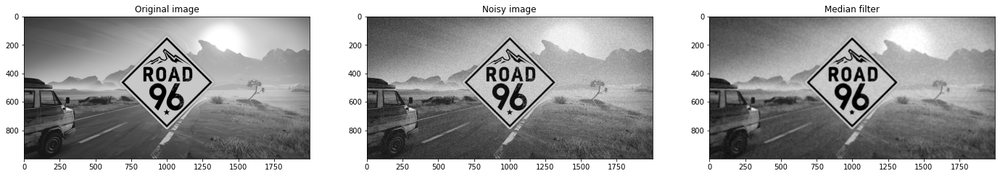

In [ ]:
from scipy.ndimage import median_filter
med = median_filter(noisy_img, 11) # use a 5 by 5 median kernel

fig, axs = plt.subplots(1, 3, figsize = (24, 8))

axs[0].imshow(kirsch_img, cmap = "gray")
axs[0].set_title("Original image")
axs[1].imshow(noisy_img, cmap = "gray")
axs[1].set_title("Noisy image")
axs[2].imshow(med, cmap = "gray")
axs[2].set_title("Median filter")

##### Bilateral Filters

It is an advanced version of Gaussian filter, it introduces another weight which shows how the two pixels can be close (or similar) to one another in value, and by considering both weights in the image, Bilateral filter can keep edges sharp while blurring the image. But the operation is slower as compared to other filters.

Text(0.5, 1.0, 'Bilaterally denoised image')

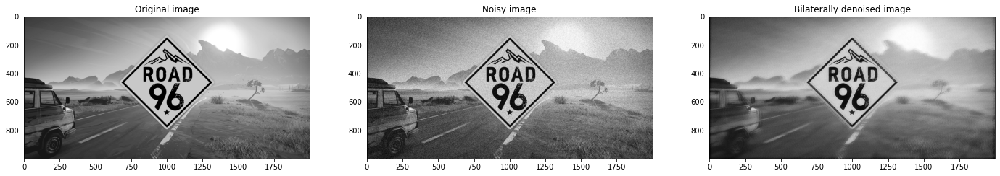

In [ ]:
from skimage.restoration import denoise_bilateral

denoised = denoise_bilateral(noisy_img, sigma_spatial = 7)

fig, axs = plt.subplots(1, 3, figsize = (24, 8))

axs[0].imshow(kirsch_img, cmap = "gray")
axs[0].set_title("Original image")
axs[1].imshow(noisy_img, cmap = "gray")
axs[1].set_title("Noisy image")
axs[2].imshow(denoised, cmap = "gray")
axs[2].set_title("Bilaterally denoised image")


##### Minimum and maximum filters

Text(0.5, 1.0, 'Maximum filter')

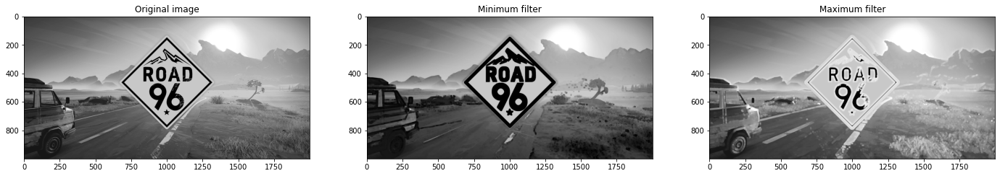

In [ ]:
# min and max filter
from scipy.ndimage import minimum_filter, maximum_filter

min = minimum_filter(kirsch_img, size = 9)
max = maximum_filter(kirsch_img, size = 9)

fig, axs = plt.subplots(1, 3, figsize = (24, 8))

axs[0].imshow(kirsch_img, cmap = "gray")
axs[0].set_title("Original image")
axs[1].imshow(min, cmap = "gray")
axs[1].set_title("Minimum filter")
axs[2].imshow(max, cmap = "gray")
axs[2].set_title("Maximum filter")


In [ ]:
# compare the linear and non-linear filtering operators
# Propose separable implementations of non-linear operators

#### Edge preserving smoothing filters
- adaptive median filters,
- Kuwahara, 
- Bilateral

###### Kuwahara filters

Text(0.5, 1.0, 'Kuwahara filter (5x5)')

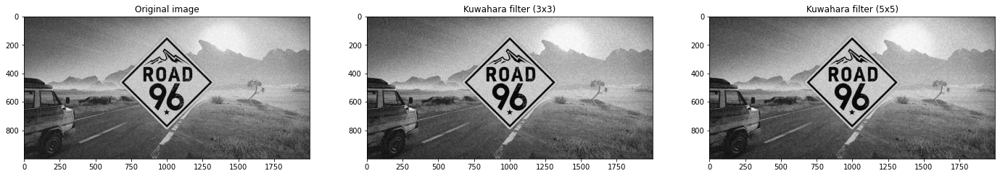

In [ ]:
import numpy as np
import cv2 as cv
 
def kuwahara(g, m=5):
     
    if m % 2 == 0:
        raise ValueError("m must be odd")
 
    rm = m // 2
    gf = np.zeros_like(g)
    ge = np.pad(g, rm, "constant")
    Dx = range(rm, ge.shape[1] - rm)
    Dy = range(rm, ge.shape[0] - rm)
 
    for y in Dy:
        for x in Dx:
            Q =[ge[y - rm: y + 1, x: x + rm + 1],
                ge[y - rm: y + 1, x - rm: x + 1],
                ge[y: y + rm + 1, x - rm: x + 1],
                ge[y: y + rm + 1, x: x + rm + 1]]
            S = [np.std(w) for w in Q]
            Smin = np.argmin(S)
            gf[y - rm][x - rm] = np.mean(Q[Smin])
    return gf

gf1 = kuwahara(noisy_img, 3)
gf2 = kuwahara(noisy_img, 5)


fig, axs = plt.subplots(1, 3, figsize = (24, 8))

axs[0].imshow(noisy_img, cmap = "gray")
axs[0].set_title("Original image")
axs[1].imshow(gf1, cmap = "gray")
axs[1].set_title("Kuwahara filter (3x3)")
axs[2].imshow(gf2, cmap = "gray")
axs[2].set_title("Kuwahara filter (5x5)")

###### Adaptive median filters

We will take a look at the Adaptive median filters to understand their edge preserving effects

Text(0.5, 1.0, 'Median filter (5x5)')

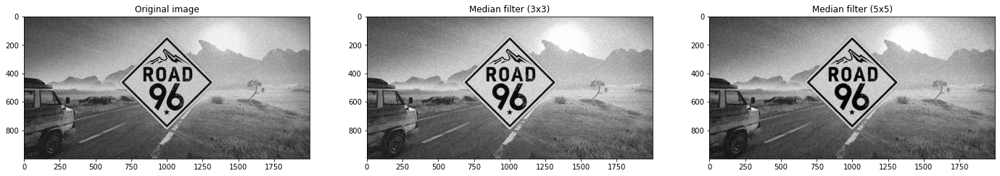

In [ ]:
def median(g, m=5):
  """Median filter"""
  
  if m % 2 == 0:
    raise ValueError("m must be odd")
    
  rm = m // 2
  gf = np.zeros_like(g)
  ge = np.pad(g, rm, "constant")
  Dx = range(rm, ge.shape[1] - rm)
  Dy = range(rm, ge.shape[0] - rm)
  
  for y in Dy:
    for x in Dx:
      W = ge[y - rm: y + rm + 1, x - rm:x + rm + 1]
      v = np.sort(W.ravel())
      med = v[(m * m + 1) // 2]
      gf[y - rm][x - rm] = med
      
  return gf

gf1 = median(noisy_img, 3)
gf2 = median(noisy_img, 5)
 
fig, axs = plt.subplots(1, 3, figsize = (24, 8))

axs[0].imshow(noisy_img, cmap = "gray")
axs[0].set_title("Original image")
axs[1].imshow(gf1, cmap = "gray")
axs[1].set_title("Median filter (3x3)")
axs[2].imshow(gf2, cmap = "gray")
axs[2].set_title("Median filter (5x5)")